In [1]:
%%HTML
<style> code {background-color : pink !important;} </style>

In [2]:
import numpy as np
import cv2
import glob
import os
import matplotlib.pyplot as plt

plt.style.use('seaborn-white')
%matplotlib inline
# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9, 0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('camera_cal/calibration*.jpg')

# Step through the list and search for chessboard corners
for idx, fname in enumerate(images):
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6), None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        cv2.drawChessboardCorners(img, (9,6), corners, ret)
        #write_name = 'corners_found'+str(idx)+'.jpg'
        #cv2.imwrite(write_name, img)
        cv2.imshow('img', img)
        cv2.waitKey(500)

cv2.destroyAllWindows()

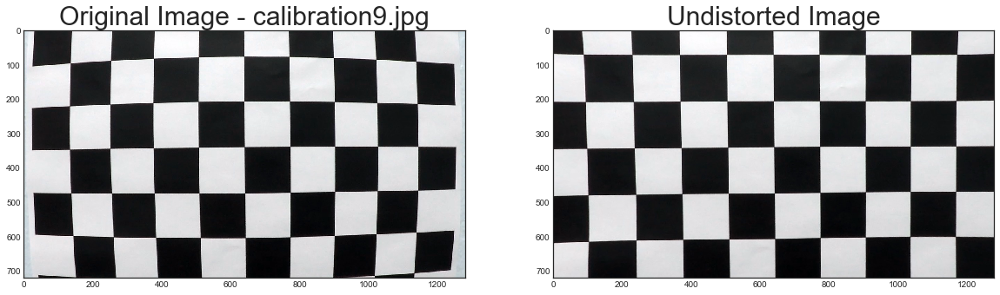

In [3]:
img = cv2.imread('camera_cal/calibration1.jpg')
img_size = (img.shape[1], img.shape[0])
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)
def undistort(img):
    return cv2.undistort(img, mtx, dist, None, mtx)


dst = undistort(img)
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(img)
ax1.set_title('Original Image - '+os.path.basename(fname), fontsize=30)
ax2.imshow(dst)
ax2.set_title('Undistorted Image', fontsize=30)
plt.savefig('output_images/undist_checkerboard.png', bbox_inches='tight')

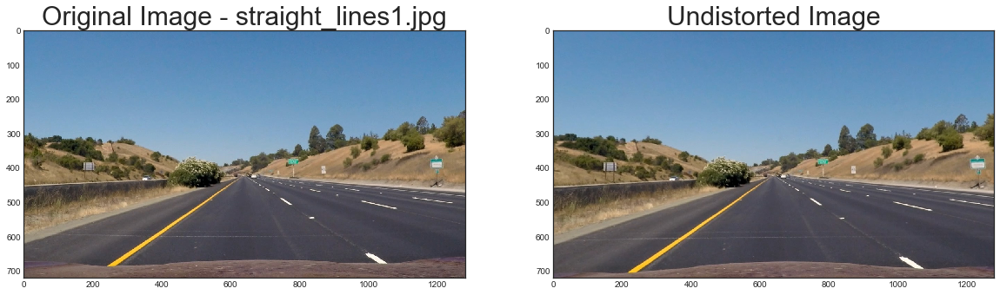

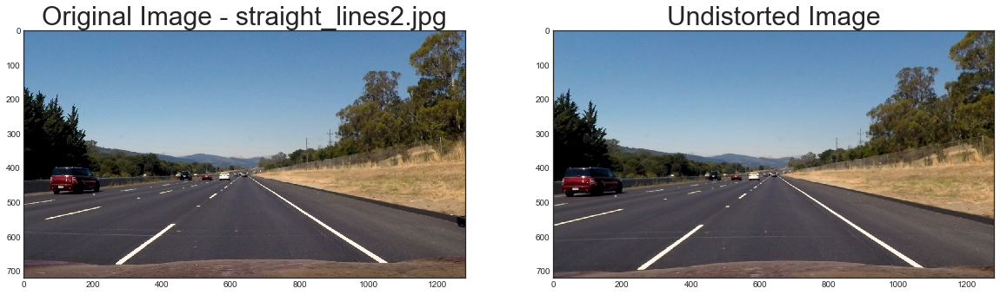

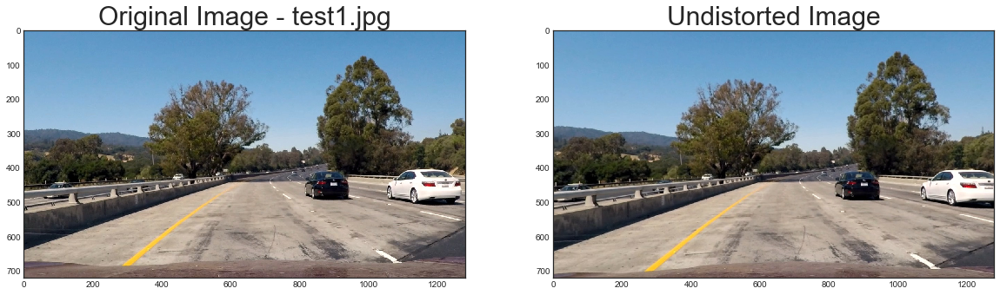

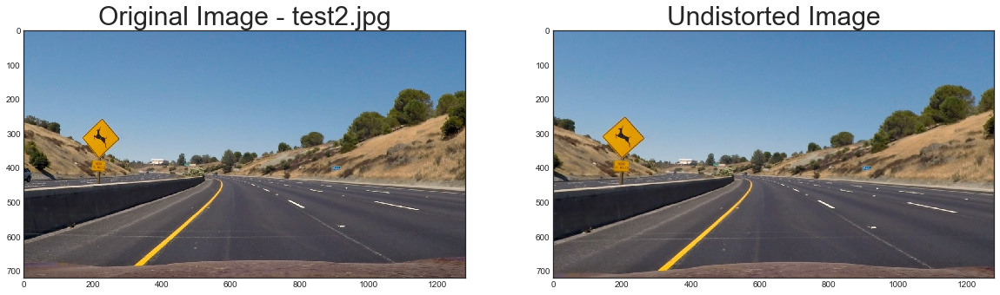

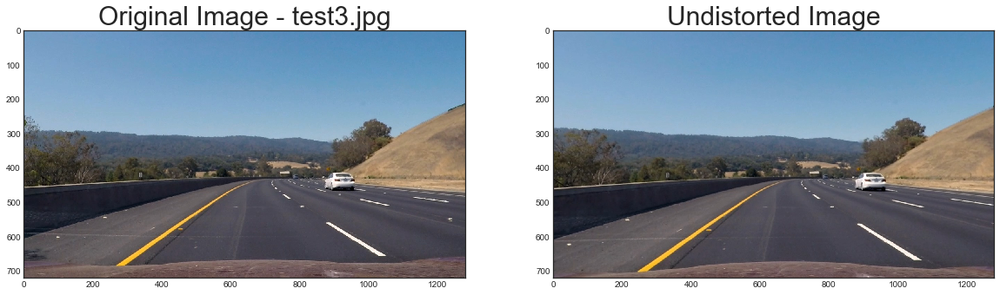

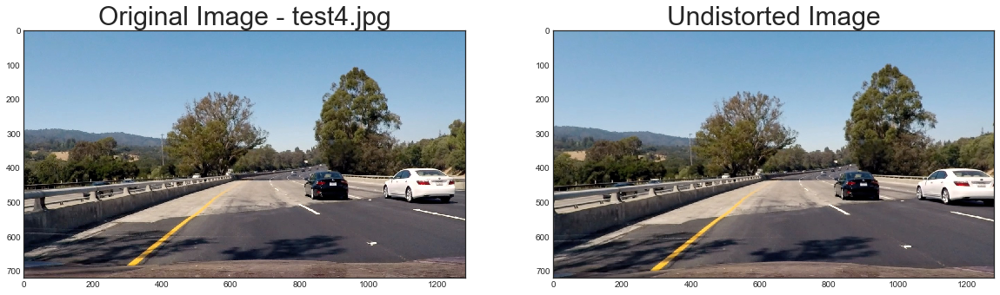

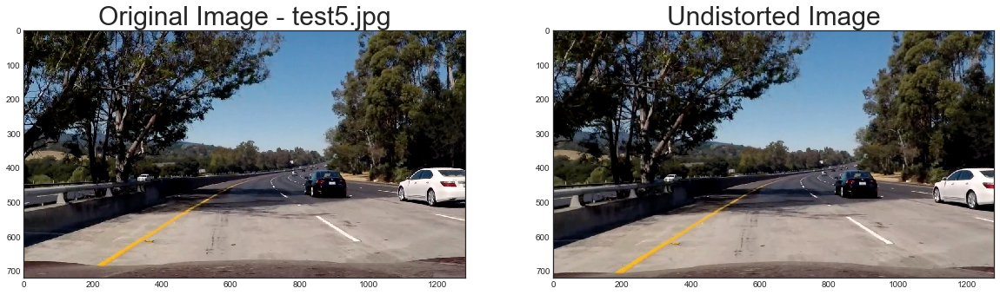

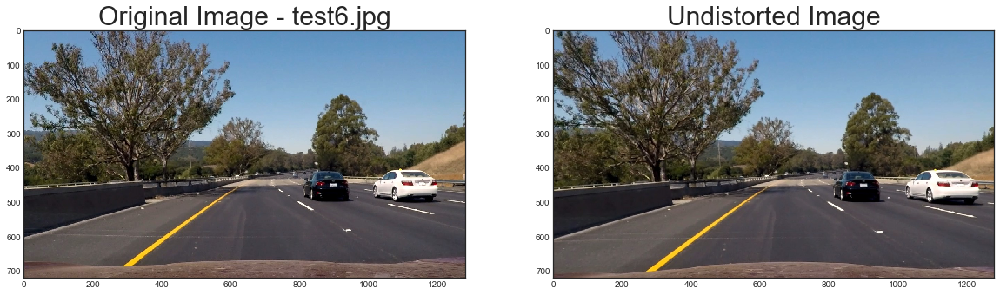

In [4]:
import scipy.misc

test_images = glob.glob('test_images/*.jpg')

# Step through the list and search for chessboard corners
for idx, fname in enumerate(test_images):
    img2 = cv2.imread(fname)
    img2_size = (img2.shape[1], img2.shape[0])
    
    dst2 = undistort(img2)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.imshow(cv2.cvtColor(img2, cv2.COLOR_BGR2RGB))
    ax1.set_title('Original Image - '+os.path.basename(fname), fontsize=30)
    ax2.imshow(cv2.cvtColor(dst2, cv2.COLOR_BGR2RGB))
    ax2.set_title('Undistorted Image', fontsize=30)
    
    plt.savefig('output_images/undist_'+os.path.basename(fname), bbox_inches='tight')

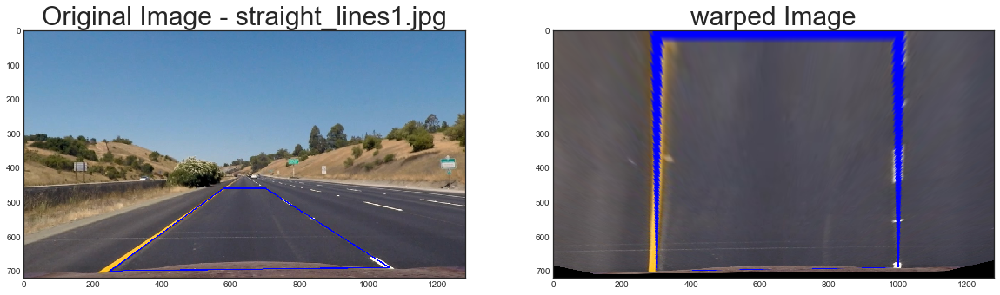

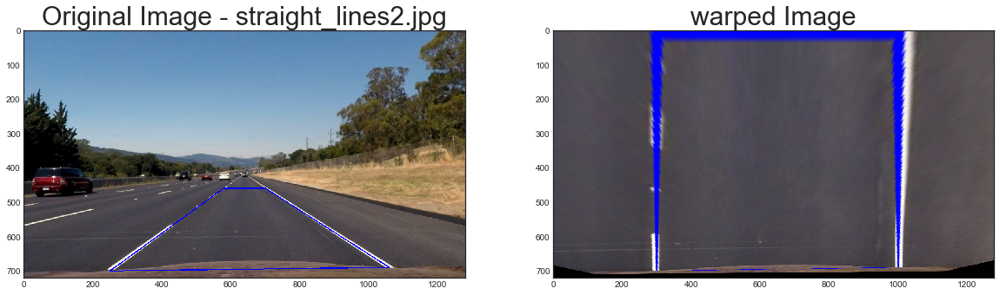

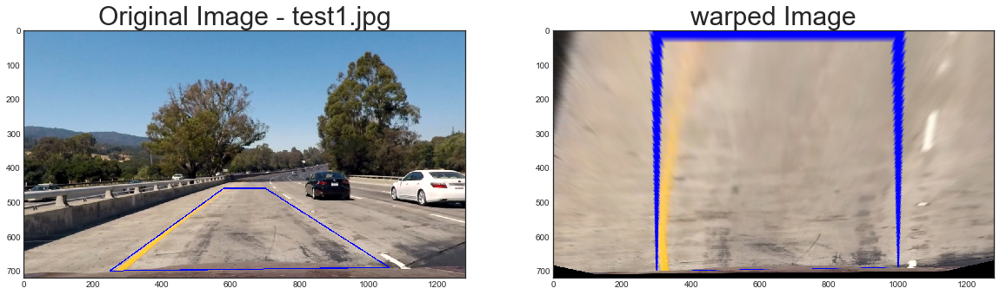

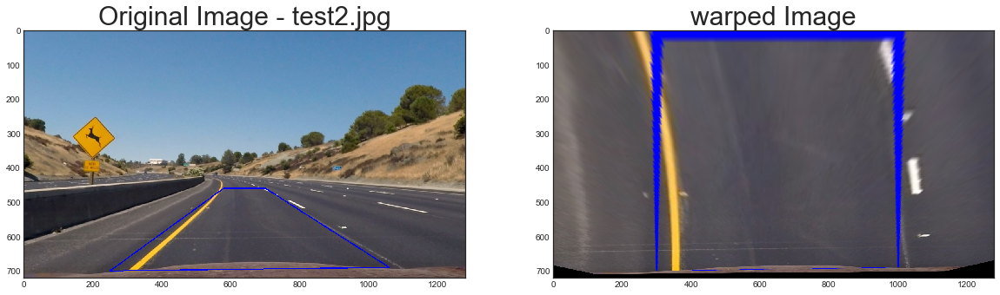

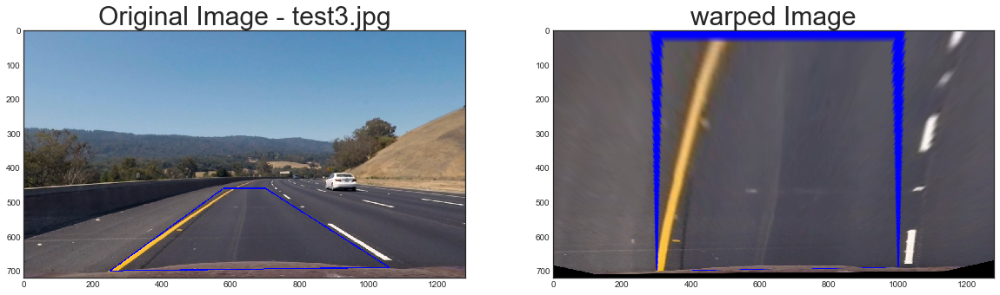

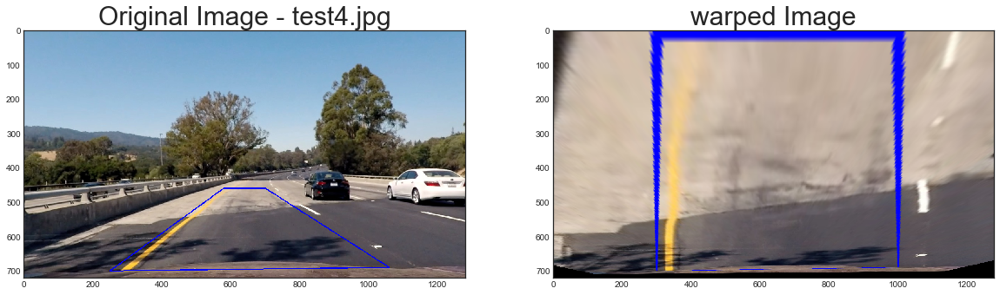

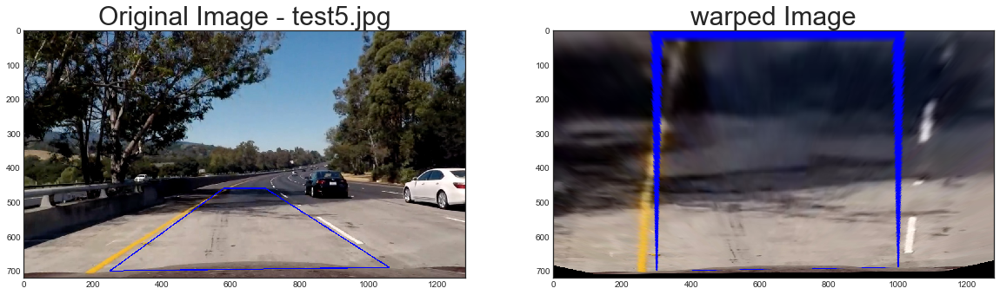

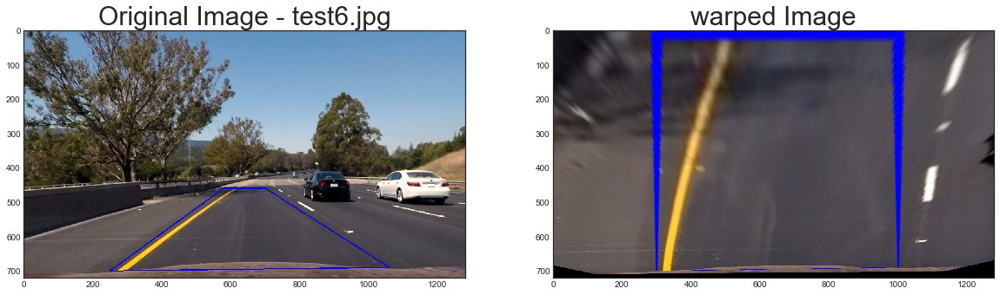

In [5]:
src = np.float32([[250, 700],[580,460],[700, 460],[1060,690]])
dest = np.float32([[300,700],[300,0],[1000,0],[1000,690]])

M=cv2.getPerspectiveTransform(src,dest)
Minv=cv2.getPerspectiveTransform(dest,src)

def warp(img):
    img_size = (img.shape[1], img.shape[0])
    return cv2.warpPerspective(img,M,img_size)


for idx, fname in enumerate(test_images):
    img2 = cv2.imread(fname)
    img2 = undistort(img2)
    img2_size = (img2.shape[1], img2.shape[0])
    cv2.line(img2, (250, 700), (580,460), color=[255,0,0], thickness=2)
    cv2.line(img2, (580,460), (700, 460), color=[255,0,0], thickness=2)
    cv2.line(img2, (700, 460), (1060,690), color=[255,0,0], thickness=2)
    cv2.line(img2, (1060,690), (250, 700), color=[255,0,0], thickness=2)
    dst2 = warp(img2)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.imshow(cv2.cvtColor(img2, cv2.COLOR_BGR2RGB))
    ax1.set_title('Original Image - '+os.path.basename(fname), fontsize=30)
    ax2.imshow(cv2.cvtColor(dst2, cv2.COLOR_BGR2RGB))
    ax2.set_title('warped Image', fontsize=30)
    
    plt.savefig('output_images/warped_'+os.path.basename(fname), bbox_inches='tight')

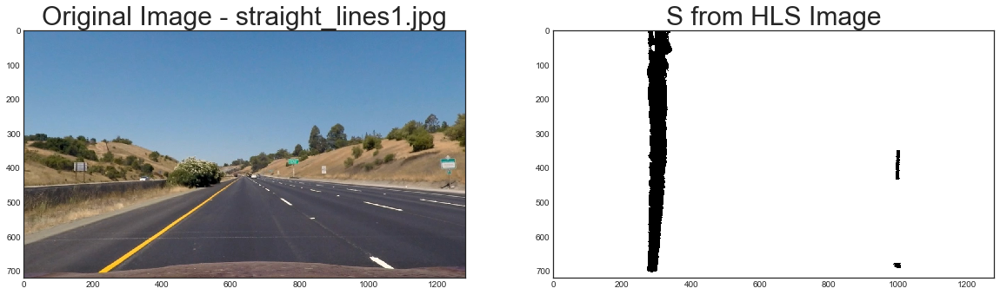

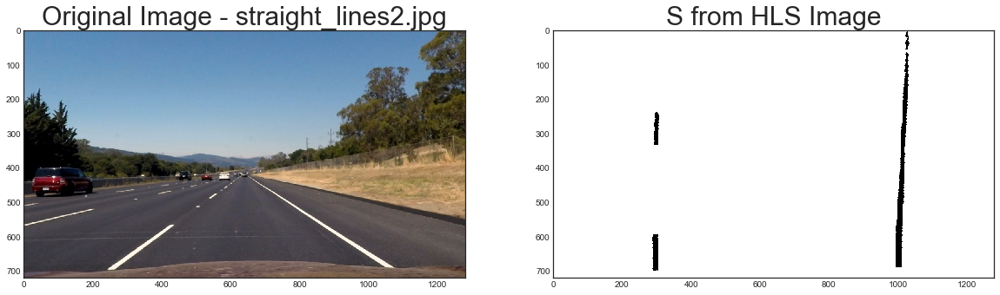

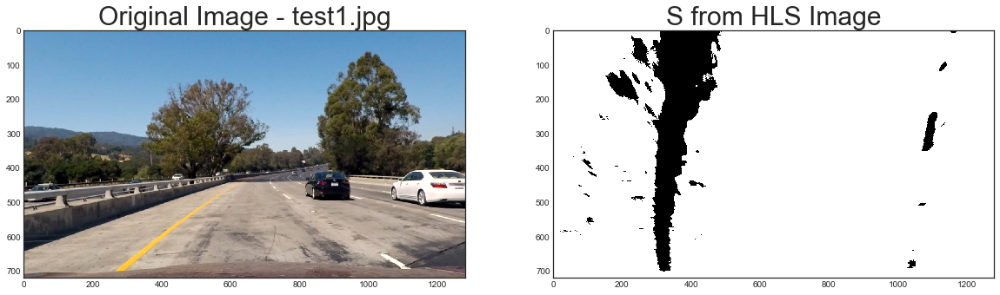

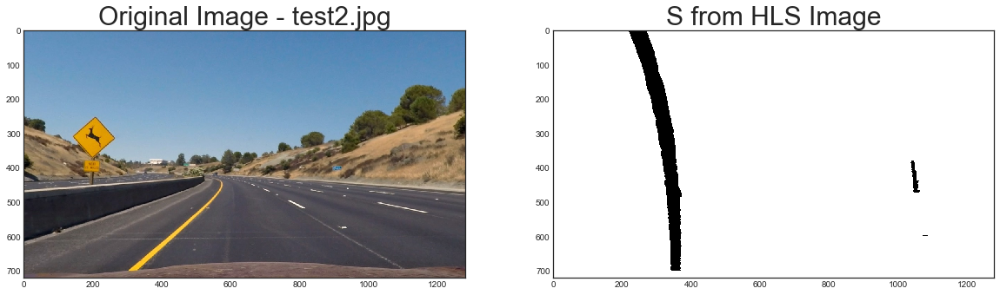

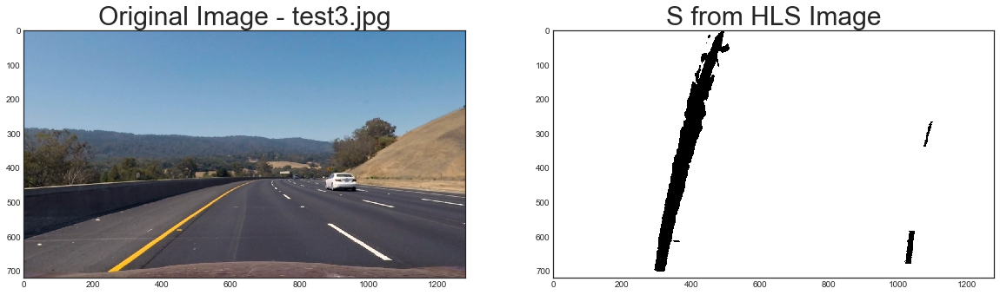

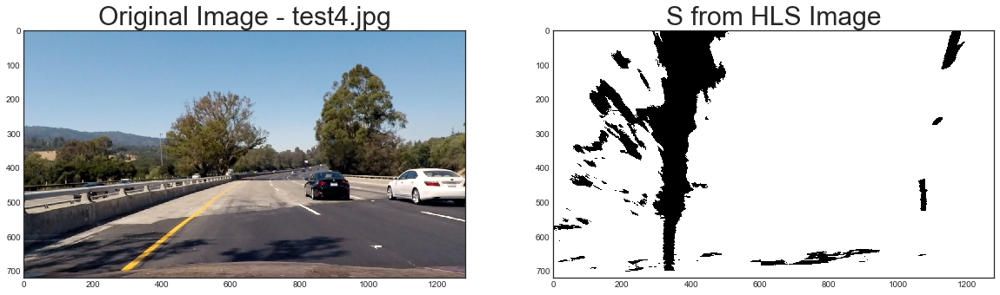

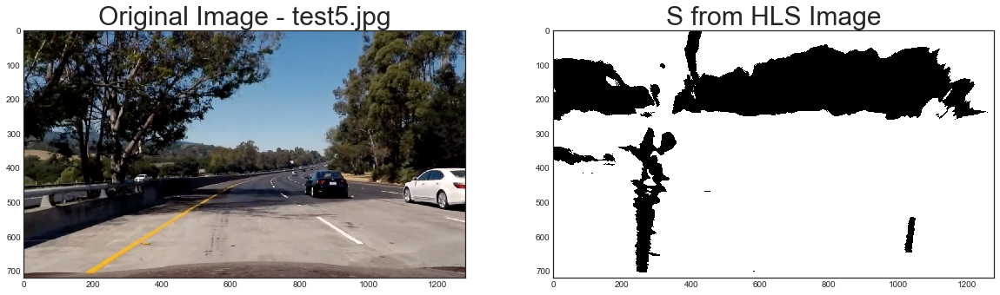

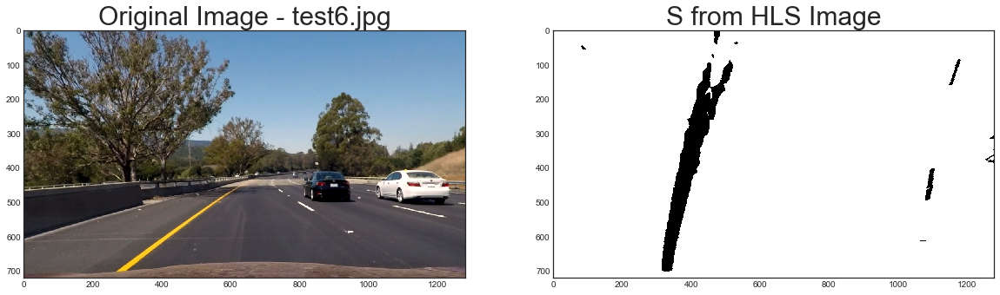

In [6]:
def hls_select(img, thresh=(0, 255)):
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS).astype(np.float)
    s_channel = hls[:,:,2]
    binary_output = np.zeros_like(s_channel)
    binary_output[(s_channel > thresh[0]) & (s_channel <= thresh[1])] = 1
    return binary_output

for idx, fname in enumerate(test_images):
    img2 = cv2.imread(fname)
    img2 = undistort(img2)
    img2_size = (img2.shape[1], img2.shape[0])
    dst2 = warp(img2)
    dst2=hls_select(dst2,(80, 255))
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.imshow(cv2.cvtColor(img2, cv2.COLOR_BGR2RGB))
    ax1.set_title('Original Image - '+os.path.basename(fname), fontsize=30)
    ax2.imshow(dst2)
    ax2.set_title('S from HLS Image', fontsize=30)
    
    plt.savefig('output_images/hls_'+os.path.basename(fname), bbox_inches='tight')

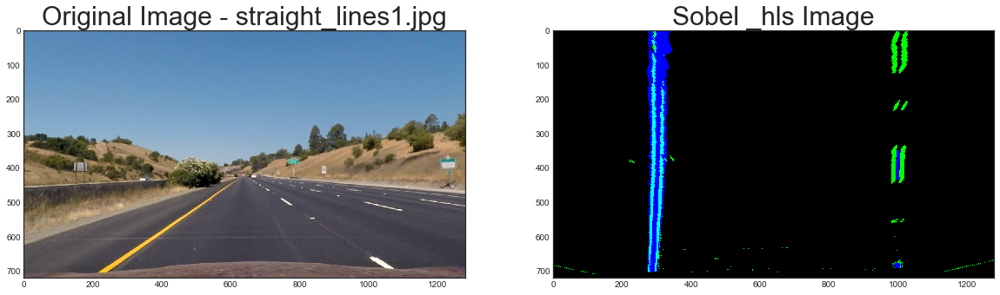

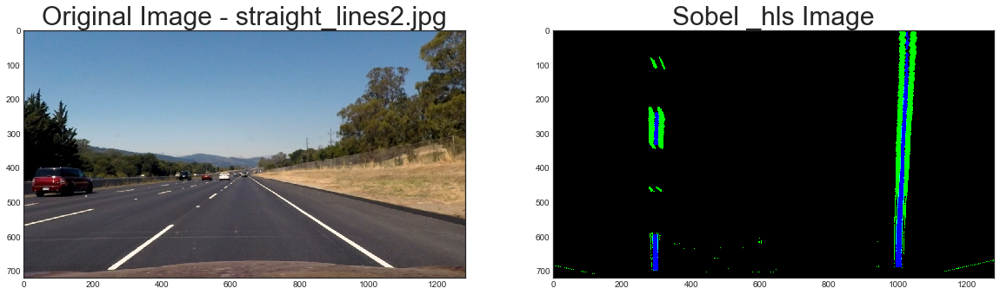

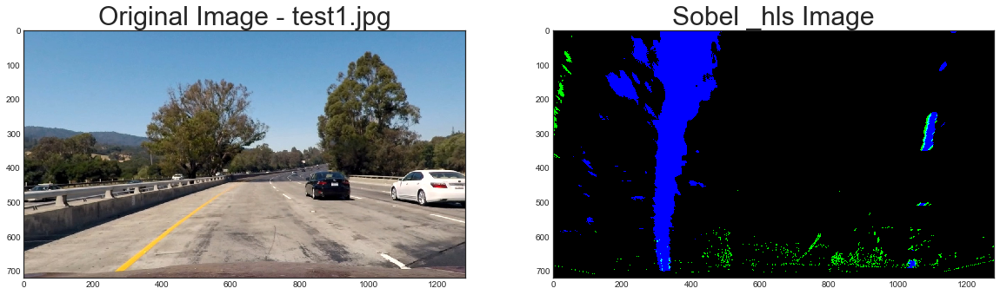

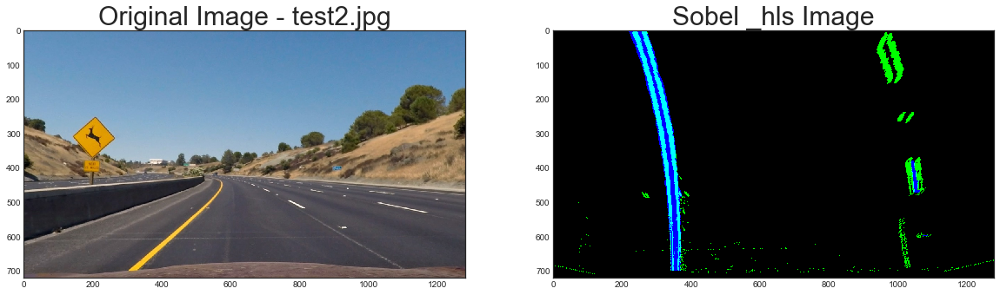

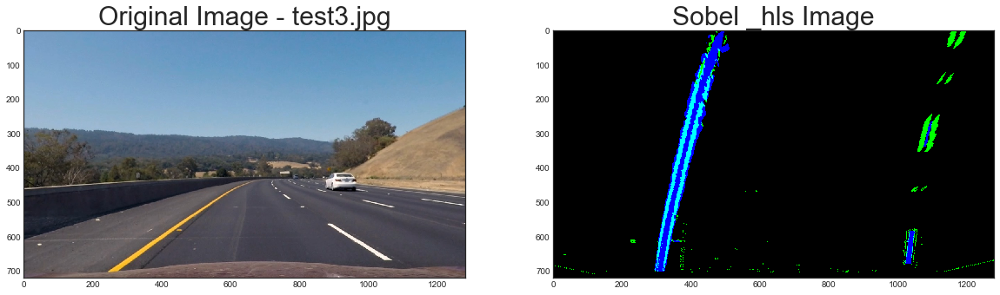

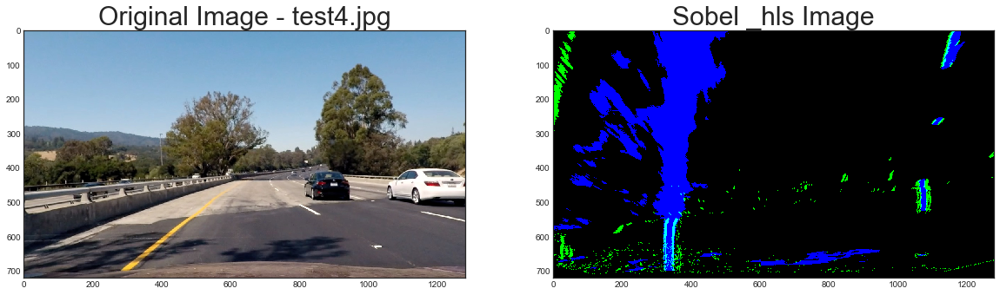

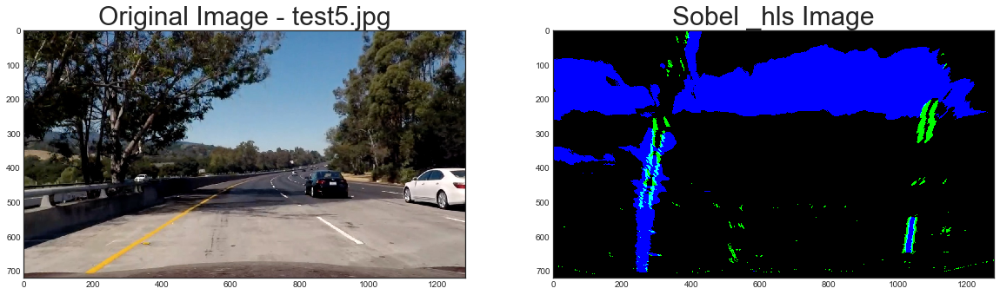

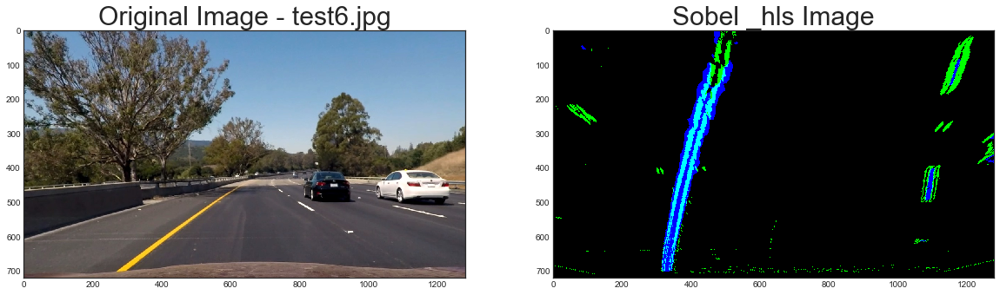

In [7]:

def useSobel(img, thresh=(20,100)):
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS).astype(np.float)
    l_channel = hls[:,:,1]
    # Sobel x
    sobelx = cv2.Sobel(l_channel, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    return sxbinary

for idx, fname in enumerate(test_images):
    img2 = cv2.imread(fname)
    img2 = undistort(img2)
    img2_size = (img2.shape[1], img2.shape[0])
    dst2 = warp(img2)
    s_binary=hls_select(dst2,(80, 255))
    sxbinary=useSobel(dst2)
    color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, s_binary))
    
    # Combine the two binary thresholds
    #combined_binary = np.zeros_like(sobel)
    #combined_binary[(hls == 1) | (sobel == 1)] = 1
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.imshow(cv2.cvtColor(img2, cv2.COLOR_BGR2RGB))
    ax1.set_title('Original Image - '+os.path.basename(fname), fontsize=30)
    ax2.imshow(color_binary)
    ax2.set_title('Sobel _hls Image', fontsize=30)
    
    plt.savefig('output_images/sobel_'+os.path.basename(fname), bbox_inches='tight')

In [8]:
def processImage(img):
    img = undistort(img)
    img_size = (img.shape[1], img.shape[0])
    dst2 = warp(img)
    s_binary=hls_select(dst2,(80, 255))
    sxbinary=useSobel(dst2)
    combined_binary = np.zeros_like(sxbinary)
    combined_binary[(s_binary == 1) | (sxbinary == 1)] = 1
    color_binary = np.dstack(( combined_binary, sxbinary, s_binary))
    return color_binary


In [9]:

# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])]  
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #x values for detected line pixels
        self.allx = None  
        #y values for detected line pixels
        self.ally = None

In [10]:
def processFrame(img):
    proccessedImg=processImage(img)[:,:,0]
    histogram = np.sum(proccessedImg[proccessedImg.shape[0]/2:,:], axis=0)
    out_img = np.stack((proccessedImg, proccessedImg, proccessedImg),axis=2)*255
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    centre=midpoint-(rightx_base-leftx_base)
    
    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(proccessedImg.shap-e[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = proccessedImg.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []
    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = proccessedImg.shape[0] - (window+1)*window_height
        win_y_high = proccessedImg.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
        # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)
    
    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    # Generate x and y values for plotting
    ploty = np.linspace(0, proccessedImg.shape[0]-1, proccessedImg.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    leftout=np.int32(np.array(list(zip(left_fitx,ploty))))
    rightout=np.int32(np.array(list(zip(right_fitx,ploty))))
    rightout=rightout[::-1]
    out_img=np.zeros_like(out_img)
    
    cv2.fillPoly(out_img,np.array([np.concatenate([leftout,rightout])],'int32'),(0,255,0))
    #cv2.polylines(out_img,np.array([np.concatenate([leftout,rightout])],'int32'),True,(0,255,0))
    newwarp = cv2.warpPerspective(out_img, Minv, (img.shape[1], img.shape[0])) 
    
    result = cv2.addWeighted(img.astype(np.uint8), 1, newwarp.astype(np.uint8), 0.3, 0)
    y_eval = np.max(ploty)
    left_curverad = ((1 + (2*left_fit[0]*y_eval + left_fit[1])**2)**1.5) / np.absolute(2*left_fit[0])
    right_curverad = ((1 + (2*right_fit[0]*y_eval + right_fit[1])**2)**1.5) / np.absolute(2*right_fit[0])
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    font = cv2.FONT_HERSHEY_SIMPLEX
    cv2.putText(result, "Left Curve - "+str(left_curverad)+"m Right Curve - "+str(right_curverad)+"m", (100, 50), font, 1, (221, 28, 119), 2)
    cv2.putText(result,"Distance from midpoint - "+str(centre*xm_per_pix)+"m",(100,90),font,1,(221,28,119),2)
    return result

for idx, fname in enumerate(test_images):
    img2 = cv2.imread(fname)
    dst = processFrame(img2)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.imshow(cv2.cvtColor(img2, cv2.COLOR_BGR2RGB))
    ax1.set_title('Original Image - '+os.path.basename(fname), fontsize=30)
    ax2.imshow(cv2.cvtColor(dst, cv2.COLOR_BGR2RGB))
    ax2.set_title('Processed Image', fontsize=30)
    
    plt.savefig('output_images/final_'+os.path.basename(fname), bbox_inches='tight')

D:\ProgramData\Miniconda3\envs\carnd-term1\lib\site-packages\ipykernel\__main__.py:3: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  app.launch_new_instance()


AttributeError: 'numpy.ndarray' object has no attribute 'shap'

In [ ]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML


In [ ]:
output = 'output.mp4'
clip1 = VideoFileClip("project_video.mp4")
clip = clip1.fl_image(processFrame) #NOTE: this function expects color images!!
%time clip.write_videofile(output, audio=False)

In [ ]:

HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(output))

In [ ]:
challenge_output = 'challenge_output.mp4'
challenge_clip1 = VideoFileClip("challenge_video.mp4")
challenge_clip = challenge_clip1.fl_image(processFrame) #NOTE: this function expects color images!!
%time challenge_clip.write_videofile(challenge_output, audio=False)

In [ ]:

HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(challenge_output))